# How to Train YOLOv5 on Custom Objects

This tutorial is based on the [YOLOv5 repository](https://github.com/ultralytics/yolov5) by [Ultralytics](https://www.ultralytics.com/). This notebook shows training on **your own custom objects**. Many thanks to Ultralytics for putting this repository together - we hope that in combination with clean data management tools at Roboflow, this technologoy will become easily accessible to any developer wishing to use computer vision in their projects.

### Accompanying Blog Post

We recommend that you follow along in this notebook while reading the blog post on [how to train YOLOv5](https://blog.roboflow.ai/how-to-train-yolov5-on-a-custom-dataset/), concurrently.

### Steps Covered in this Tutorial

In this tutorial, we will walk through the steps required to train YOLOv5 on your custom objects. We use a [public blood cell detection dataset](https://public.roboflow.ai/object-detection/bccd), which is open source and free to use. You can also use this notebook on your own data.

To train our detector we take the following steps:

* Install YOLOv5 dependencies
* Download custom YOLOv5 object detection data
* Write our YOLOv5 Training configuration
* Run YOLOv5 training
* Evaluate YOLOv5 performance
* Visualize YOLOv5 training data
* Run YOLOv5 inference on test images
* Export saved YOLOv5 weights for future inference



### **About**

[Roboflow](https://roboflow.com) enables teams to deploy custom computer vision models quickly and accurately. Convert data from to annotation format, assess dataset health, preprocess, augment, and more. It's free for your first 1000 source images.

**Looking for a vision model available via API without hassle? Try Roboflow Train.**

![Roboflow Wordmark](https://i.imgur.com/dcLNMhV.png)



#Install Dependencies

_(Remember to choose GPU in Runtime if not already selected. Runtime --> Change Runtime Type --> Hardware accelerator --> GPU)_

In [ ]:
# clone YOLOv5 repository

############ In VS code I had to run this comands at terminal #######
# !git clone https://github.com/ultralytics/yolov5  # clone repo
# %cd yolov5
# !git reset --hard fbe67e465375231474a2ad80a4389efc77ecff99
#####################################################################

Bash cell were used to set the enviroment

In [ ]:
# %%bash

# git clone https://github.com/ultralytics/yolov5  # clone repo
# cd yolov5
# git reset --hard fbe67e465375231474a2ad80a4389efc77ecff99

In [ ]:
# %%bash
# pip install -qr requirements.txt

## Libraries

In [9]:
# install dependencies as necessary
# ! pip install -qr requirements.txt  # install dependencies (ignore errors)

import torch
from IPython.display import Image, clear_output  # to display images
from yolov5.utils.downloads import attempt_download  # to download models/datasets


import yaml
from roboflow import Roboflow
from IPython.core.magic import register_line_cell_magic
from utils.plots import plot_results  # plot results.txt as results.png

# clear_output()
print('Setup complete. Using torch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

Setup complete. Using torch 2.3.0+cu121 _CudaDeviceProperties(name='NVIDIA RTX A2000 12GB', major=8, minor=6, total_memory=12039MB, multi_processor_count=26)


# Download Correctly Formatted Custom Dataset

We'll download our dataset from Roboflow. Use the "**YOLOv5 PyTorch**" export format. Note that the Ultralytics implementation calls for a YAML file defining where your training and test data is. The Roboflow export also writes this format for us.

To get your data into Roboflow, follow the [Getting Started Guide](https://blog.roboflow.ai/getting-started-with-roboflow/).



![YOLOv5 PyTorch export](https://i.imgur.com/5vr9G2u.png)


In [ ]:
#follow the link below to get your download code from from Roboflow
# !pip install -q roboflow
# from roboflow import Roboflow
# rf = Roboflow(model_format="yolov5", notebook="roboflow-yolov5", api_key="1u6jwBB2HGHWrQWOmGMd")

In [6]:
# %%bash
# pip install roboflow

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 74.9/74.9 kB 336.7 kB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 158.3/158.3 kB 758.1 kB/s eta 0:00:00 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 178.7/178.7 kB 1.6 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 510.5 kB/s eta 0:00:00 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.1/49.1 MB 5.1 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 793.1 kB/s eta 0:00:00a 0:00:01
  Attempting uninstall: idna
    Found existing installation: idna 3.7
    Uninstalling idna-3.7:
      Successfully uninstalled idna-3.7
  Attempting uninstall: cycler
    Found existing installation: cycler 0.12.1
    Uninstalling cycler-0.12.1:
      Successfully uninstalled cycler-0.12.1
  Attempting uninstall: certifi
    Found existing installation: certifi 2024.2.2
    Uninstalling certifi-2024.2.2:
      Successfully uninstalled certifi-2024.2.2


In [7]:
%ls

CONTRIBUTING.md  hubconf.py  LICENSE       README.md         train.py
data/            IP-4/       models/       requirements.txt  tutorial.ipynb
detect.py        IPP-2/      nohup.out     runs/             utils/
export.py        IPP-3/      __pycache__/  setup.cfg         val.py


In [10]:
## On terminal ##
# !pip install roboflow
%cd yolov5/

## Code extract from roboflow dataset version ##

rf = Roboflow(api_key="1u6jwBB2HGHWrQWOmGMd")
project = rf.workspace("thejeff").project("ipp")
version = project.version(5)
dataset = version.download("yolov5")



[Errno 2] No such file or directory: 'yolov5/'
/home/gita24/Documentos/UdeA/GITA/Pratech/Pratech_IR_Project/Yolo_Example/yolov5
loading Roboflow workspace...
loading Roboflow project...
Exporting format yolov5pytorch in progress : 85.0%
Version export complete for yolov5pytorch format



Extracting Dataset Version Zip to IPP-5 in yolov5pytorch:: 100%|██████████| 898/898 [00:00<00:00, 24461.35it/s]


In [ ]:
%cd /content/yolov5
#after following the link above, recieve python code with these fields filled in
#from roboflow import Roboflow
# rf = Roboflow(api_key="1u6jwBB2HGHWrQWOmGMd")
# project = rf.workspace().project("IP")
# dataset = project.version("v2").download("yolov5")

/content/yolov5


In [11]:
# this is the YAML file Roboflow wrote for us that we're loading into this notebook with our data
%cat {dataset.location}/data.yaml

names:
- logo
- signature
nc: 2
roboflow:
  license: CC BY 4.0
  project: ipp
  url: https://universe.roboflow.com/thejeff/ipp/dataset/5
  version: 5
  workspace: thejeff
test: ../test/images
train: IPP-5/train/images
val: IPP-5/valid/images


# Define Model Configuration and Architecture

We will write a yaml script that defines the parameters for our model like the number of classes, anchors, and each layer.

You do not need to edit these cells, but you may.

In [12]:
# define number of classes based on YAML

with open(dataset.location + "/data.yaml", 'r') as stream:
    num_classes = str(yaml.safe_load(stream)['nc'])

print(num_classes)

2


In [5]:
#this is the model configuration we will use for our tutorial

%cat models/yolov5s.yaml

# %cat models/yolov5s.yaml

# YOLOv5 🚀 by Ultralytics, GPL-3.0 license

# Parameters
nc: 80  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Conv, [64, 6, 2, 2]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 6, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 3, C3, [1024]],
   [-1, 1, SPPF, [1024, 5]],  # 9
  ]

# YOLOv5 v6.0 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]]

In [13]:
#customize iPython writefile so we can write variables


@register_line_cell_magic
def writetemplate(line, cell):
    with open(line, 'w') as f:
        f.write(cell.format(**globals()))

In [14]:
%%writetemplate models/custom_yolov5s.yaml
# %%writetemplate models/custom_yolov5s.yaml

# parameters
nc: {num_classes}  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple


# default anchors
# anchors:
#   - [10,13, 16,30, 33,23]  # P3/8
#   - [30,61, 62,45, 59,119]  # P4/16
#   - [116,90, 156,198, 373,326]  # P5/32

# Definded anchors
anchors:
  - [50,33, 96,50, 131,45]  # P3/8
  - [174,52, 147,66, 219,47]  # P4/16
  - [194,71, 263,57, 233,84]  # P5/32


# YOLOv5 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Focus, [64, 3]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, BottleneckCSP, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 9, BottleneckCSP, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, BottleneckCSP, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 1, SPP, [1024, [5, 9, 13]]],
   [-1, 3, BottleneckCSP, [1024, False]],  # 9
  ]

# YOLOv5 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, BottleneckCSP, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, BottleneckCSP, [256, False]],  # 17 (P3/8-small)

   [-1, 1, Conv, [256, 3, 2]],
   [[-1, 14], 1, Concat, [1]],  # cat head P4
   [-1, 3, BottleneckCSP, [512, False]],  # 20 (P4/16-medium)

   [-1, 1, Conv, [512, 3, 2]],
   [[-1, 10], 1, Concat, [1]],  # cat head P5
   [-1, 3, BottleneckCSP, [1024, False]],  # 23 (P5/32-large)

   [[17, 20, 23], 1, Detect, [nc, anchors]],  # Detect(P3, P4, P5)
  ]


In [15]:
#this is the model configuration we will use for our tutorial
%cat models/custom_yolov5s.yaml

# %%writetemplate models/custom_yolov5s.yaml

# parameters
nc: 2  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple


# default anchors
# anchors:
#   - [10,13, 16,30, 33,23]  # P3/8
#   - [30,61, 62,45, 59,119]  # P4/16
#   - [116,90, 156,198, 373,326]  # P5/32

# Definded anchors
anchors:
  - [50,33, 96,50, 131,45]  # P3/8
  - [174,52, 147,66, 219,47]  # P4/16
  - [194,71, 263,57, 233,84]  # P5/32


# YOLOv5 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Focus, [64, 3]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, BottleneckCSP, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 9, BottleneckCSP, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, BottleneckCSP, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 1, SPP, [1024, [5, 9, 13]]],
   [-1, 3, BottleneckCSP, [1024, False]],  # 9
  ]

# YOLOv5 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [

# Train Custom YOLOv5 Detector

### Next, we'll fire off training!


Here, we are able to pass a number of arguments:
- **img:** define input image size
- **batch:** determine batch size
- **epochs:** define the number of training epochs. (Note: often, 3000+ are common here!)
- **data:** set the path to our yaml file
- **cfg:** specify our model configuration
- **weights:** specify a custom path to weights. (Note: you can download weights from the Ultralytics Google Drive [folder](https://drive.google.com/open?id=1Drs_Aiu7xx6S-ix95f9kNsA6ueKRpN2J))
- **name:** result names
- **nosave:** only save the final checkpoint
- **cache:** cache images for faster training

In [14]:
%%bash

python train.py --img 640 --batch 30 --epochs 1000 --data IPP-5/data.yaml --cfg ./models/custom_yolov5s.yaml --weights '' --name yolov5s_results  --cache


train: weights=, cfg=./models/custom_yolov5s.yaml, data=IPP-4/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=1000, batch_size=26, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=yolov5s_results, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: ⚠️ YOLOv5 is out of date by 685 commits. Use `git pull` or `git clone https://github.com/ultralytics/yolov5` to update.
YOLOv5 🚀 v6.1-306-gfbe67e46 Python-3.9.19 torch-2.3.0+cu121 CUDA:0 (NVIDIA RTX A2000 12GB, 12039MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=

In [ ]:
# %%bash
# # train yolov5s on custom data for 100 epochs
# # time its performance
# # %%time
# cd yolov5/
# ## Train from scratch ##
# # python train.py --img 640 --batch 30 --epochs 100 --data {dataset.location}/data.yaml --cfg ./models/custom_yolov5s.yaml --weights '' --name yolov5s_results  --cache


# python train.py --img 640 --batch 30 --epochs 500 --data IP-2/data.yaml --cfg ./models/custom_yolov5s.yaml --weights '' --name yolov5s_results  --cache

# ## Use pretrained weights ##
# # !python train.py --img 640 --batch 30 --epochs 100 --data {dataset.location}/data.yaml --cfg ./models/custom_yolov5s.yaml --weights yolov5m.pt --name yolov5s_results  --cache

# Evaluate Custom YOLOv5 Detector Performance

Training losses and performance metrics are saved to Tensorboard and also to a logfile defined above with the **--name** flag when we train. In our case, we named this `yolov5s_results`. (If given no name, it defaults to `results.txt`.) The results file is plotted as a png after training completes.

Note from Glenn: Partially completed `results.txt` files can be plotted with `from utils.utils import plot_results; plot_results()`.

In [ ]:
# Start tensorboard
# Launch after you have started training
# # logs save in the folder "runs"
# %load_ext tensorboard
# %tensorboard --logdir runs

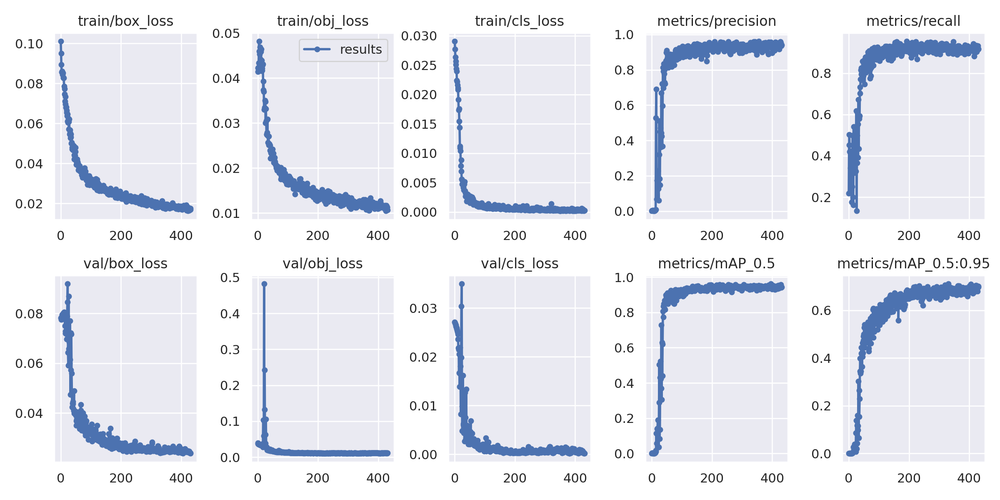

In [17]:
# we can also output some older school graphs if the tensor board isn't working for whatever reason...

Image(filename='runs/train/yolov5s_results6/results.png', width=1000)  # view results.png

### Curious? Visualize Our Training Data with Labels

After training starts, view `train*.jpg` images to see training images, labels and augmentation effects.

Note a mosaic dataloader is used for training (shown below), a new dataloading concept developed by Glenn Jocher and first featured in [YOLOv4](https://arxiv.org/abs/2004.10934).

In [ ]:
# first, display our ground truth data
# print("GROUND TRUTH TRAINING DATA:")
# Image(filename='runs/train/yolov5s_results6/test_batch0_labels.jpg', width=900)

In [ ]:
# print out an augmented training example
# print("GROUND TRUTH AUGMENTED TRAINING DATA:")
# Image(filename='/content/yolov5/runs/train/yolov5s_results/train_batch0.jpg', width=900)

#Run Inference  With Trained Weights
Run inference with a pretrained checkpoint on contents of `test/images` folder downloaded from Roboflow.

In [19]:
%ls runs/train/yolov5s_results5/weights

best.pt  last.pt


In [21]:
%%bash
python detect.py --weights runs/train/yolov5s_results6/weights/best.pt --img 640 --conf 0.4 --source IPP-5/test/images

detect: weights=['runs/train/yolov5s_results6/weights/best.pt'], source=IPP-5/test/images, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.1-306-gfbe67e46 Python-3.9.19 torch-2.3.0+cu121 CUDA:0 (NVIDIA RTX A2000 12GB, 12039MiB)

Fusing layers... 
custom_YOLOv5s summary: 232 layers, 7249215 parameters, 0 gradients, 16.7 GFLOPs
image 1/82 /home/gita24/Documentos/UdeA/GITA/Pratech/Pratech_IR_Project/Yolo_Example/yolov5/IPP-5/test/images/aam09c00_png.rf.b6f63cb817d9e74075b88a932a169f65.jpg: 640x640 1 signature, Done. (0.006s)
image 2/82 /home/gita24/Documentos/UdeA/GITA/Pratech/Pratech_IR_Project/Yolo_Example/yolov5/IPP-5/test/images/alk3aa00_png.rf.61

In [ ]:
# when we ran this, we saw .007 second inference time. That is 140 FPS on a TESLA P100!
# use the best weights!
# %cd /content/yolov5/
# !python detect.py --weights runs/train/yolov5s_results6/weights/best.pt --img 640 --conf 0.4 --source ../test/images

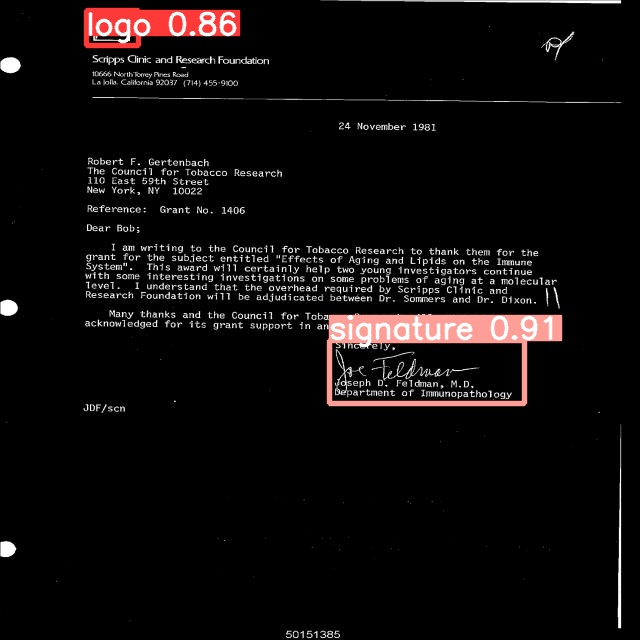

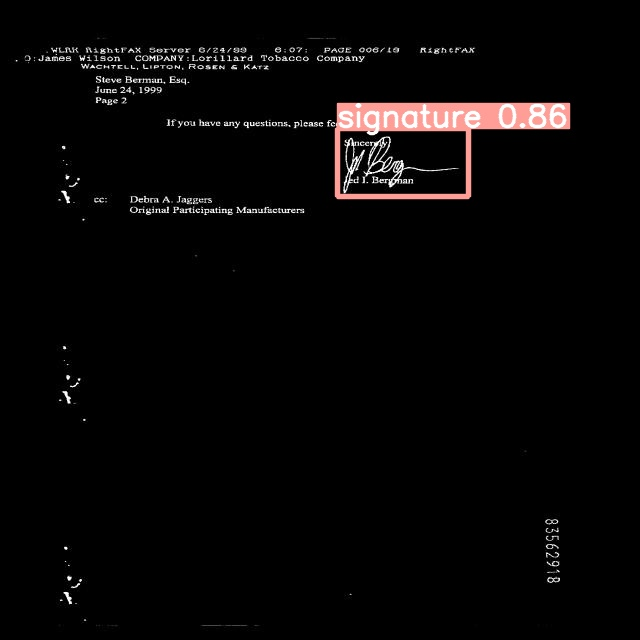

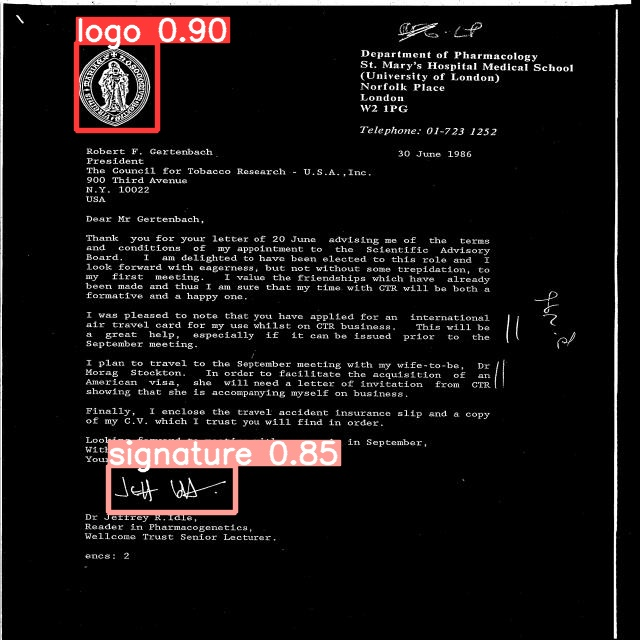

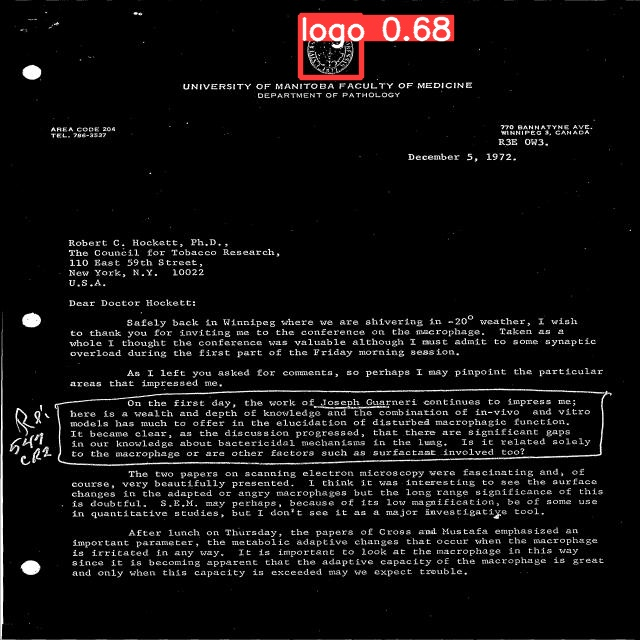

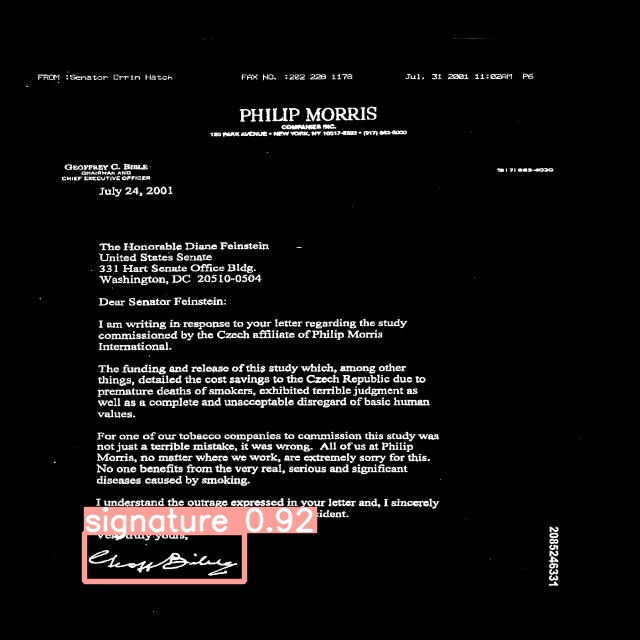

...

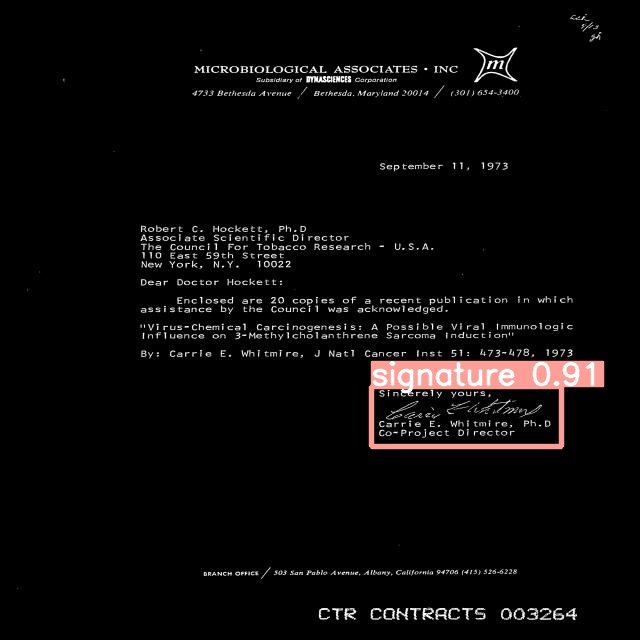

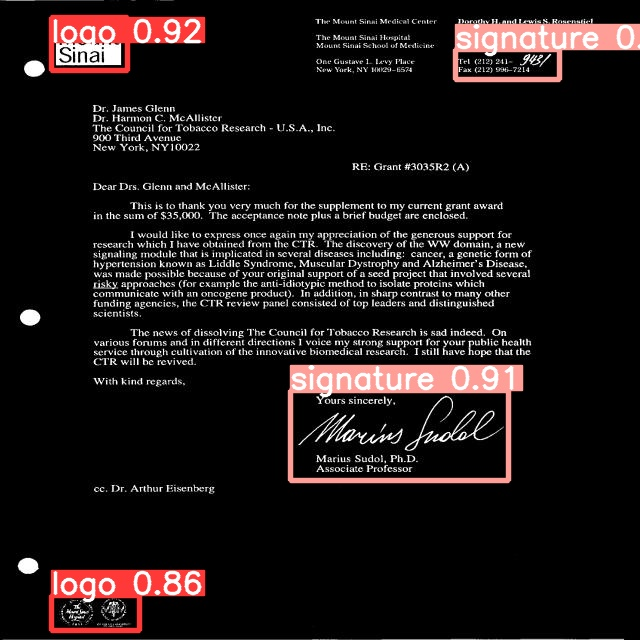

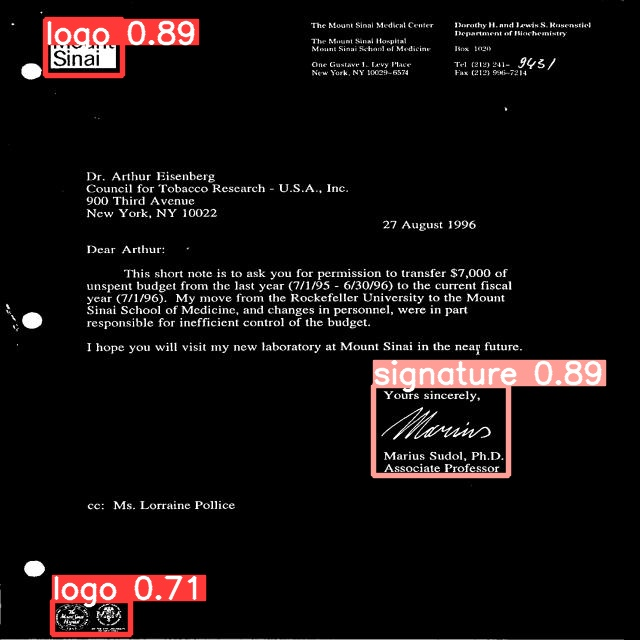

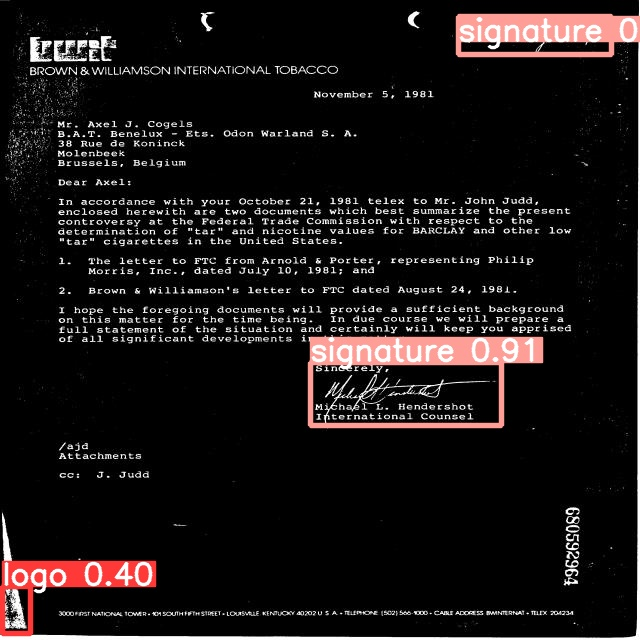

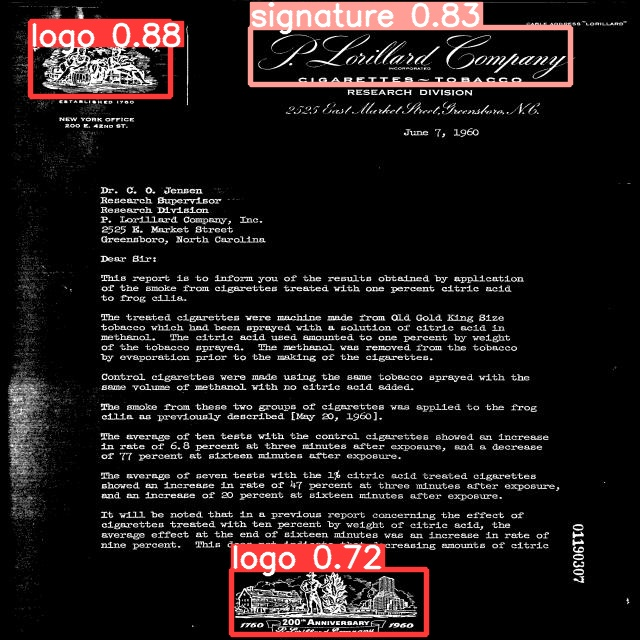

In [23]:
#display inference on ALL test images
#this looks much better with longer training above

import glob
from IPython.display import Image, display

for imageName in glob.glob('runs/detect/exp6/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

# Export Trained Weights for Future Inference

Now that you have trained your custom detector, you can export the trained weights you have made here for inference on your device elsewhere

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
%cp /content/yolov5/runs/train/yolov5s_results/weights/best.pt /content/gdrive/My\ Drive

## Congrats!

Hope you enjoyed this!

--Team [Roboflow](https://roboflow.ai)